***

# O que torna uma música "TikTokável" ?

***
**Autor:** Jorge Luiz Figueira

**E-mail:** jorgeluizfigueira@gmail.com

**Linkedin:** https://www.linkedin.com/in/jorgeluizfigueira/

### Sobre este projeto

As análises deste notebook fazem parte de um projeto pessoal, que busca entender se existem padrões 
em músicas que são sucesso no aplicativo de compartilhamento de vídeos curtos, o TikTok.

Além de respostas para o título deste projeto, espera-se desenvolver soft-skills como Comunicação e Pensamento
Crítico. E hard-skills, como Python e Visualização de Dados.

O conjunto de dados analisado trata-se de uma lista de músicas organizada pelo próprio TikTok e disponível como playlist no Spotify. A playlist contempla músicas que foram/são hits na rede social de vídeos. A coleta de dados foi realizada no dia 29/03/2022 por meio da biblioteca Spotipy e possui 288 músicas. 

**Uma observação importante:** poucos dias depois da coleta, o TikTok "diluiu" a playlist utilizada para esse estudo, em outras por categorias de países. A fim de garantir a replicabilidade, é disponibilizado um arquivo CSV com os dados utilizados. 

De acordo com a literatura, músicas podem ser analisadas quanto ao conteúdo (características de aúdio) ou ao contexto(metadados, sendo as letras de músicas como principal). 

O foco da análise das músicas se deu pelas duas abordagens, obtendo as características de aúdio computadas pelo Spotify. E posteriormente por meio da biblioteca LyricsGenius, foi feita a aquisição automática da maioria das letras e avaliadas quanto a algumas caracterísiticas textuais simples.

**Algumas Hipóteses:**
- Músicas que são sucesso no TikTok são mais curtas
- As músicas tendem ser "agitadas e com mais energia"
- Suas letras são repetitivas
- Possuem uma temática feita para um público jovem

Para facilitar o entendimento da análise, este notebook está organizado em seções. Sendo que todos os códigos possuem um breve comentário explicando o que é feito/obtido. 

A respeito dos achados, apenas algumas observações são mantidas aqui, a conclusão geral da análise foi compilada em formato de **artigo no Medium**:  

## 01. Aquisição dos dados

Abaixo são definidos alguns métodos construídos com a biblioteca **Spotipy**. Onde são obtidos dados e características de áudio das músicas. Para manipulação dos dados é utilizado **Pandas**

**Nota**: Para usar o Spotipy, primeiro é necessário ter acesso a API do Spotify. Isso pode ser obtido de uma maneira muito simples. Acessando o Dashboard(link abaixo), na opção "Create an App". Salve os seguintes dados: client_id e client_secret

Documentação Spotipy:
https://spotipy.readthedocs.io/en/2.19.0/

Obter API
https://developer.spotify.com/dashboard/

In [1]:
import spotipy
from spotipy.oauth2 import SpotifyClientCredentials
import pandas as pd

In [2]:
#Autenticação

client_id ="YOUR-CLIENT-ID" 

client_secret = "YOUR-CLIENT-SECRET"

client_credentials_manager = SpotifyClientCredentials(client_id, client_secret) 
#Create Spotify object 
sp  = spotipy.Spotify(client_credentials_manager=client_credentials_manager)

In [3]:
#Obtém recursos de áudio para uma ou várias faixas com base em seus parâmetros de IDs do Spotify

def get_playlist_tracks(username,playlist_id):
    results = sp.user_playlist_tracks(username,playlist_id)
    tracks = results['items']
    while results['next']:
        results = sp.next(results)
        tracks.extend(results['items'])
    return tracks

In [4]:
#Obtém recursos de áudio para uma ou várias faixas com base em seus parâmetros de IDs do Spotify

def get_audio_features(spotify,ids):

    #Como o Spotipy atualmente permite até 100 ids por requisição
    #O comando abaixo divide em listas de até 100 itens
    n = 100 #limite
    ids_lists = [ids[i:i + n] for i in range(0, len(ids), n)] 
    
    audio_features = []
    for ids in ids_lists:
        audio_features+=spotify.audio_features(ids)
        
    music_features = pd.DataFrame(audio_features)

    return music_features

In [5]:
#Obtém playlists de um usuário, por meio de seu ID

def get_user_playlists(spotify, user_id):
    playlists = spotify.user_playlists(user_id)
    while playlists:
        for i, playlist in enumerate(playlists['items']):
            print(f"{i + 1 + playlists['offset']} {playlist['uri']} {playlist['name']}")
        if playlists['next']:
            playlists = spotify.next(playlists)
        else:
            playlists = None

Como mencionado antes, serão analizadas músicas da playlist de hits feita pelo próprio TikTok. Para obtermos esses dados, precisamos saber o id do perfil. Nas imagens abaixo é ilustrado como obter o ID.

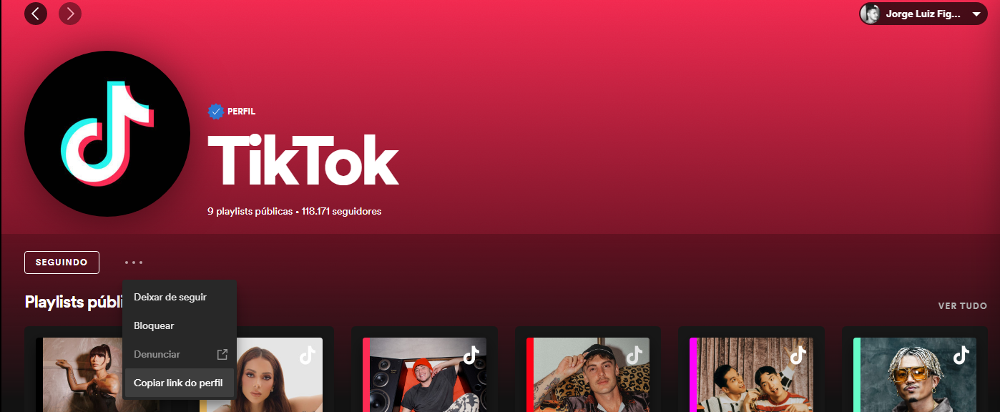

In [6]:
#Retorna as playlists do usuário com seus respectivos IDs
#get_user_playlists(sp,'ef8zswxc6q41041caiq7x28pa')

In [7]:
#Retorna os metadados das músicas dada playlist e usuário
#track_results = get_playlist_tracks("ef8zswxc6q41041caiq7x28pa", "4FLeoROn5GT7n2tZq5XB4V")

In [8]:
#Como a saída de get_playlist_tracks é um JSON, usamos a iteração pra converter em um DataFrame Pandas
#Cada iteração corresponde a uma linha

#tracks = pd.DataFrame([[t["track"]["id"], t["track"]["name"],t["track"]["artists"][0]["name"], t["track"]["explicit"]] 
                          
                          #for t in track_results],
                         
                         #columns=["id", "song_name", "artist_name", "explicit"]) 

In [9]:
#tracks.head()

In [10]:
#Converte o valores booleanos para strings
#tracks['explicit'] = tracks['explicit'].apply(lambda x: 'True' if x == True else 'False') 

Como o TikTok alterou a playlist que usamos como base neste projeto, deixei comentado acima os métodos que foram utilizados.
E abaixo carrego os dados que foram obtidos.

In [11]:
tracks = pd.read_csv('tiktok_songs_29032022.csv')

In [12]:
#Obtendo as características de audio das músicas do TikTok
audio_features = get_audio_features(sp,list(tracks["id"]))

In [13]:
audio_features.head()

,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,type,id,uri,track_href,analysis_url,duration_ms,time_signature
0,0.770,0.699,0,-6.590,1,0.1990,0.0596,0.000017,0.1700,0.696,81.003,audio_features,1ojBtNRMzjL7ptLPZCzfRz,spotify:track:1ojBtNRMzjL7ptLPZCzfRz,https://api.spotify.com/v1/tracks/1ojBtNRMzjL7...,https://api.spotify.com/v1/audio-analysis/1ojB...,165315,4
1,0.772,0.483,8,-9.177,1,0.0381,0.8890,0.010200,0.0626,0.839,130.989,audio_features,4qqf1avpzRUnVowNQd1jFw,spotify:track:4qqf1avpzRUnVowNQd1jFw,https://api.spotify.com/v1/tracks/4qqf1avpzRUn...,https://api.spotify.com/v1/audio-analysis/4qqf...,135653,4
2,0.899,0.396,11,-11.571,0,0.2770,0.0536,0.000062,0.1950,0.314,101.544,audio_features,6AG2zjruUpoYu9hunhx2lg,spotify:track:6AG2zjruUpoYu9hunhx2lg,https://api.spotify.com/v1/tracks/6AG2zjruUpoY...,https://api.spotify.com/v1/audio-analysis/6AG2...,130351,4
3,0.803,0.640,1,-4.721,1,0.1510,0.5830,0.000331,0.4370,0.816,140.073,audio_features,0N0h5lXc4HOiLgGb9EZi8m,spotify:track:0N0h5lXc4HOiLgGb9EZi8m,https://api.spotify.com/v1/tracks/0N0h5lXc4HOi...,https://api.spotify.com/v1/audio-analysis/0N0h...,96826,4
4,0.584,0.194,10,-13.375,1,0.0337,0.9010,0.000564,0.0829,0.470,106.556,audio_features,3Vxc7fLBmG8vNk6G6Va9Nz,spotify:track:3Vxc7fLBmG8vNk6G6Va9Nz,https://api.spotify.com/v1/tracks/3Vxc7fLBmG8v...,https://api.spotify.com/v1/audio-analysis/3Vxc...,162013,3


In [14]:
list(audio_features)

['danceability',
 'energy',
 'key',
 'loudness',
 'mode',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'type',
 'id',
 'uri',
 'track_href',
 'analysis_url',
 'duration_ms',
 'time_signature']

In [15]:
#Seleçao dos atributos de interesse
audio_features = audio_features[['danceability',
 'energy',
 'speechiness',
 'acousticness',
 'instrumentalness',
 'liveness',
 'valence',
 'tempo',
 'duration_ms',
'mode','key']].copy()

audio_features.head()

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,mode,key
0,0.770,0.699,0.1990,0.0596,0.000017,0.1700,0.696,81.003,165315,1,0
1,0.772,0.483,0.0381,0.8890,0.010200,0.0626,0.839,130.989,135653,1,8
2,0.899,0.396,0.2770,0.0536,0.000062,0.1950,0.314,101.544,130351,0,11
3,0.803,0.640,0.1510,0.5830,0.000331,0.4370,0.816,140.073,96826,1,1
4,0.584,0.194,0.0337,0.9010,0.000564,0.0829,0.470,106.556,162013,1,10


## 02. Pequenas Conversões

Entre as características obtidas, é dado a duração das faixas em milisegundos. Acredito que possamos ter uma interpretação melhor se essa medida estiver em segundos.

Além disso, as características mode e key embora sejam representadas em números, são variaveis categóricas.

Abaixo são criadas funções para tratarmos esses valores e ganhamos mais a frente uma melhor compreensão dos dados.

In [16]:
def miliseconds2seconds(ms):
    seconds = ms/1000
    return seconds

def label_mode(mode):
    if mode == 0:
        return 'Minor'
    else:
        return 'Major'

def label_keys(key):
    
    keys = ['C','C#','D','D#','E','F','F#','G','G#','A','A#','B'] 
        
    if key != -1:
        return keys[key]
    else:
        return 'null'

In [17]:
#Convertemos a duração das faixas para segundos e salvamos em uma nova coluna
audio_features['duration_seconds'] = audio_features['duration_ms'].apply(miliseconds2seconds)
#Deletamos a coluna antiga
audio_features.drop(columns=['duration_ms'],inplace=True)

#Rotula as variaveis categóricas
audio_features['mode'] = audio_features['mode'].apply(label_mode)
audio_features['key'] = audio_features['key'].apply(label_keys)

audio_features.head()

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo,mode,key,duration_seconds
0,0.770,0.699,0.1990,0.0596,0.000017,0.1700,0.696,81.003,Major,C,165.315
1,0.772,0.483,0.0381,0.8890,0.010200,0.0626,0.839,130.989,Major,G#,135.653
2,0.899,0.396,0.2770,0.0536,0.000062,0.1950,0.314,101.544,Minor,B,130.351
3,0.803,0.640,0.1510,0.5830,0.000331,0.4370,0.816,140.073,Major,C#,96.826
4,0.584,0.194,0.0337,0.9010,0.000564,0.0829,0.470,106.556,Major,A#,162.013


## 03. Uma dose de estatística

É chamado o método describe() do Pandas para termos uma visão geral dos dados, como análise das médias, quartis.

Mais adiante é criada uma função que nos ajudará em observar os percentuais de cada característica 

In [18]:
audio_features.describe()

,danceability,energy,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_seconds
count,288.000000,288.00000,288.000000,288.000000,288.000000,288.000000,288.000000,288.000000,288.000000
mean,0.708903,0.59537,0.140277,0.243942,0.045058,0.177381,0.504720,121.175792,192.572083
std,0.167266,0.19183,0.129372,0.277007,0.163178,0.139852,0.236801,27.007129,60.876339
min,0.266000,0.04000,0.027600,0.000068,0.000000,0.032800,0.037100,70.604000,38.487000
25%,0.593750,0.46225,0.044150,0.023150,0.000000,0.091875,0.314000,99.997500,154.791750
50%,0.736000,0.61850,0.081550,0.130000,0.000002,0.118000,0.501000,121.486500,183.087000
75%,0.844250,0.73325,0.207000,0.373250,0.000302,0.216750,0.696750,139.755250,223.915250
max,0.979000,0.96000,0.751000,0.995000,0.942000,0.922000,0.978000,216.053000,551.124000


In [19]:
#Calcula o percentual de ocorrências de uma feature cujo seu valor é maior ou menor que um valor especificado 
def get_percentage(df,fieldname,rule,value):
    n = len(df[fieldname])
    
    if rule == 'greater':
        percentage = (len(df[df[fieldname] >= value])/n)*100
        
        return f'{round(percentage,2)}% das músicas possuem {fieldname} igual ou superior a {value}'
    
    if rule == 'less':
        percentage = (len(df[df[fieldname] <= value])/n)*100
        
        return f'{round(percentage,2)}% das músicas possuem {fieldname} igual ou inferior a {value}'
        

## 04. Visualização dos dados

Abaixo é definido a função que nos ajudará em obter o gráfico das distribuições das características das músicas

In [20]:
import plotly.express as px
import plotly.graph_objects as go
import numpy as np

import warnings
warnings.filterwarnings("ignore")


def hist(dataframe,fieldname,color):
    
    yaxis_title = 'Quantidade de Músicas'
    #Função principal do histograma
    fig = px.histogram(dataframe, x=fieldname,
                    title=f'Distribuição para {fieldname.capitalize()}', color_discrete_sequence=[color], labels={
                         fieldname: fieldname.capitalize()
                     }).update_layout(yaxis_title=yaxis_title)

    if(type(dataframe[fieldname][0]) != str):
        
        mean = dataframe[fieldname].mean()

        #Acessa dados de desenvolvimento para pegar altura onde a legenda será automaticamente posicionada. 
        full_figure = fig.full_figure_for_development()
        xbins = full_figure.data[0].xbins
        plotbins = list(np.arange(start=xbins['start'], stop=xbins['end']+xbins['size'], step=xbins['size']))
        counts, bins = np.histogram(list(full_figure.data[0].x), bins=plotbins)

        #Traceja uma linha indincando a média
        fig.add_shape(
                go.layout.Shape(
                    type="line",
                    y0=0,
                    x0=mean,
                    y1=max(counts),
                    x1=mean,
                    line=dict(
                        color="Orange",
                        width=4,
                        dash="dash",
                    ),
            ))

        #Adiciona a legenda 'Média'
        fig.update_layout(bargap=0.1)
        fig.add_trace(go.Scatter(
            x=[mean],
            y=[max(counts)+.4],
            text=["Média"],
            mode="text",
        ))

    
    return fig

In [21]:
hist(audio_features,'danceability', 'dodgerblue')

In [22]:
get_percentage(audio_features,'danceability','greater',0.6)

'74.31% das músicas possuem danceability igual ou superior a 0.6'

In [23]:
hist(audio_features,'instrumentalness', 'dodgerblue')

In [24]:
get_percentage(audio_features,'instrumentalness','greater',0.5)

'4.51% das músicas possuem instrumentalness igual ou superior a 0.5'

In [25]:
hist(audio_features,'energy', 'dodgerblue')

In [26]:
get_percentage(audio_features,'energy','greater',0.55)

'60.42% das músicas possuem energy igual ou superior a 0.55'

In [27]:
hist(audio_features,'liveness', 'dodgerblue')

In [28]:
get_percentage(audio_features,'liveness','greater',0.8)

'0.35% das músicas possuem liveness igual ou superior a 0.8'

In [29]:
hist(audio_features,'acousticness', 'dodgerblue')

In [30]:
get_percentage(audio_features,'acousticness','less',0.5)

'82.64% das músicas possuem acousticness igual ou inferior a 0.5'

In [31]:
hist(audio_features,'speechiness','dodgerblue')

In [32]:
get_percentage(audio_features,'speechiness','less',0.5)

'98.96% das músicas possuem speechiness igual ou inferior a 0.5'

In [33]:
hist(audio_features,'valence','dodgerblue')

In [34]:
get_percentage(audio_features,'valence','greater',0.5)

'50.35% das músicas possuem valence igual ou superior a 0.5'

In [35]:
hist(audio_features,'tempo','dodgerblue')

In [36]:
get_percentage(audio_features,'tempo','greater',100)
#Esse intervalo dos valores de BPM são típicos dos genêros Pop, Rock e os genêros eletrônicos
#https://www.musical-u.com/learn/rhythm-tips-for-identifying-music-genres-by-ear/

'75.0% das músicas possuem tempo igual ou superior a 100'

In [37]:
hist(audio_features,'duration_seconds','dodgerblue')

In [38]:
get_percentage(audio_features,'duration_seconds','less',200)
#Músicas tendem ser curtas
#https://www.statista.com/chart/26546/mean-song-duration-of-currently-streamable-songs-by-year-of-release/

'61.81% das músicas possuem duration_seconds igual ou inferior a 200'

In [39]:
hist(audio_features,'mode','dodgerblue')

In [40]:
hist(audio_features,'key','dodgerblue')

## 05. Aquisição dos dados - Parte II - Letras das Músicas

Como mencionado no começo deste notebook, vamos analisar as músicas quanto suas letras. Para isso, primeiro é necessário obtê-las. Abaixo está definido algumas configuração e métodos para obtermos as letras de forma automática utilizando a biblioteca **LyricsGenius**.

**Nota**: Para usar o LyricsGenius, primeiro é necessário ter Token de acesso a API doGenius. Isso pode ser obtido de uma maneira muito simples também. Acessando o link do Genius abaixo e criando uma conta.

Documentação LyricsGenius:
https://lyricsgenius.readthedocs.io/

Obter API
https://genius.com/api-clients/new

In [41]:
from lyricsgenius import Genius

token = 'YOUR-GENIUS-TOKEN'

genius = Genius(token)

# Turn off status messages
genius.verbose = False

# Remove section headers (e.g. [Chorus]) from lyrics when searching
genius.remove_section_headers = True

In [42]:
def get_lyrics(artist_name,song_name):
    try:
        song = genius.search_song(title=song_name, artist=artist_name)
        lyrics = song.lyrics
        return lyrics.replace('\n','.')
    except:
        try:
            song_name = song_name.split('(')[0].strip() #evita ruídos no título...
            song = genius.search_song(title=song_name, artist=artist_name)
            lyrics = song.lyrics
            return lyrics.replace('\n','.')
        except:
            return "not found"

In [43]:
lyrics = []

#Recuperação das letras é um passo que DEMORA mesmo. (Você pode utilizar a lib tqdm para acompanhar o progresso)
for artist, song in zip(tracks.artist_name, tracks.song_name):
    lyrics.append(get_lyrics(artist,song))

In [44]:
lyrics.count('not found')

12

In [45]:
tracks['lyrics'] = lyrics
#Mantemos apenas as linhas que as letras foram encontradas
tracks = tracks[tracks.lyrics != 'not found'].copy()

## 06. Breve inspeção e filtrando somente as letras em inglês

Percebi que haviam alguns erros simples nas letras, como presença do título da música e ruídos como a palavra "embed". Foram criados alguns métodos para corrigi-los. Mais adiante, foi percebido que a grande parte das letras são em inglês, então decidi filtrar somente estas

In [46]:
tracks['lyrics'][0]
#tracks['lyrics'][0]
#tracks['lyrics'][0]

"Thinking With My Dick Lyrics.Got money, retarded.Don't want her if it don't clap when she walking.Ain't too pretty in the face, but she super thick.I'm just thinking with my dick.My shit dumb.I'm just thinking with my dick.My shit dumb.I'm just thinking with my dick..Skip the line, on my mind.VIP going mad.Bands a make her dance.With a bag full of Xans.Got my Vans in advance.Acting bad on them tabs.Pants cost a grand.Put that ass in my hands.Duffel bag full of cash.She a model? I'ma get her.Seen 'em now.She stop, popped, and squat by the zipper.Thinking out loud.My dick probably tryna kill her.Help her somebody.The bitch wiped on the liquor.Going live.Long hair, shawty ride like Geronimo.Say I got the gas.We ain't talkin' 'bout Conoco.Knock the whole clique down.I'm talking like dominoes.One hit wonder.When we finish, adiós.Got money, retarded.Don't want her if it don't clap when she walking.Ain't too pretty in the face, but she super thick.I'm just thinking with my dick.My shit dumb.

In [47]:
def fix_title_and_sentences(lyrics):
    fixed_sentences = []
    
    for sentence in lyrics.split('.')[1:]:
        if (sentence != ''):
            fixed_sentences.append(sentence)
            
    new_lyrics = '.'.join(fixed_sentences)
    
    return new_lyrics

def removeEmbed(lyrics):
    new_lyrics = lyrics.replace('Embed', '')
    return new_lyrics

In [48]:
tracks['lyrics'] = tracks['lyrics'].apply(fix_title_and_sentences)
tracks['lyrics'] = tracks['lyrics'].apply(removeEmbed)

In [49]:
import pycld2 as cld2

#detecta automaticamente o idioma
def detect_language(text):
    isReliable, textBytesFound, details = cld2.detect(text)
    return details[0][0]

In [50]:
tracks['lang'] = tracks['lyrics'].apply(detect_language)

In [51]:
set(tracks.lang)

{'ENGLISH', 'FRENCH', 'ITALIAN', 'RUSSIAN', 'SPANISH', 'Unknown'}

In [52]:
len(tracks[tracks.lang == 'ENGLISH'])

261

In [53]:
english_tracks = tracks[tracks.lang == 'ENGLISH'].copy()

## 07. Pré-processamento das letras e Extração das características textuais


In [54]:
from string import punctuation, whitespace
import re

#Trata ruídos simples das letras das músicas
def simple_preprocessing(text):
    text = text.lower()
    text = text.encode('ascii',errors='ignore').decode()
    text =  re.sub(r"[0-9]+", "", text)
    text = re.sub(r"\.|,|;|:|-|!|\?|´|`|^|'", " ", text)
    text = text.replace('(','').replace(')','').replace('"','')
    
    #fixing extra whitespaces
    words = []
    for word in [re.sub('\s+',' ',word).strip() for word in text.split(" ")]:
        if len(word)>0:
            words.append(word)
    text = ' '.join(words) 
    
    return text

#Retorna quantidade de palavras
def word_counter(text):
    num_words = len(text.split(' '))
    
    return num_words

#Retorna quantidade do conjunto de palavras
def uniqueWordsCounter(text):
    return len(set(text.split(' ')))

#Retorna uma lista das palavras que apareceram uma única vez
def only_once(text):
    d, result = dict(),[]
    
    for word in re.split('['+punctuation+whitespace+']', text):
        d[word.lower()] = d.get(word.lower(), 0)+1
        
    for word, occur in d.items():
        if occur ==1:
            result.append(word)
            
    return result

#Retorna a quantidade de palavras que aparecem uma única vez
def rareWordsCounter(text):
    rare_words = len(only_once(text))
    return rare_words

#Taxa de palavras raras 
def rareWordsRatio(text):
    unique = rareWordsCounter(text)
    words = word_counter(text)
    ratio = float(unique/words)
    return ratio

#Retorna a quantidade de versos
def sentence_counter(text):
    num_sentences = len(text.split('.'))
    
    return num_sentences

#Retorna a diversidade lexical
def lexical_diversity(text):
    ld = (uniqueWordsCounter(text)/word_counter(text))
    return ld

In [55]:
#Extraindo as métricas para as letras
english_tracks['lyrics_preprocessed'] =  english_tracks['lyrics'].apply(simple_preprocessing)
english_tracks['words'] =  english_tracks['lyrics_preprocessed'].apply(word_counter)
english_tracks['unique_words'] =  english_tracks['lyrics_preprocessed'].apply(uniqueWordsCounter)
english_tracks['rare_words'] =  english_tracks['lyrics_preprocessed'].apply(rareWordsRatio)
english_tracks['sentences'] =  english_tracks['lyrics'].apply(sentence_counter)
english_tracks['avgWordsSentence'] =  np.array(english_tracks['words'])/ np.array(english_tracks['sentences'])
english_tracks['lexical_diversity'] =  english_tracks['lyrics_preprocessed'].apply(lexical_diversity)

In [56]:
english_tracks.head()

,id,song_name,artist_name,explicit,lyrics,lang,lyrics_preprocessed,words,unique_words,rare_words,sentences,avgWordsSentence,lexical_diversity
0,1ojBtNRMzjL7ptLPZCzfRz,Thinking with My Dick (feat. Juicy J),Kevin Gates,True,"Got money, retarded.Don't want her if it don't...",ENGLISH,got money retarded don t want her if it don t ...,399,164,0.265664,60,6.650000,0.411028
2,6AG2zjruUpoYu9hunhx2lg,Cash App,Louie Ray,True,(Enrgy made this one).(It's a Wayne beat).Ahh....,ENGLISH,enrgy made this one it s a wayne beat ahh yop ...,475,216,0.290526,48,9.895833,0.454737
3,0N0h5lXc4HOiLgGb9EZi8m,Rocking A Cardigan in Atlanta,lil Shordie Scott,True,I wanna take a pic with Cardi B inside my card...,ENGLISH,i wanna take a pic with cardi b inside my card...,319,122,0.184953,35,9.114286,0.382445
4,3Vxc7fLBmG8vNk6G6Va9Nz,Crazy,Patsy Cline,False,"Crazy, I'm crazy for feeling so lonely.I'm cra...",ENGLISH,crazy i m crazy for feeling so lonely i m craz...,102,41,0.186275,12,8.500000,0.401961
5,6XhLvHFFGw89NbGfpINRyn,Reading Rainbow Theme Song,Reading Rainbow,False,"Butterfly in the sky, I can go twice as high.T...",ENGLISH,butterfly in the sky i can go twice as high ta...,53,28,0.283019,11,4.818182,0.528302


In [57]:
english_tracks.mean()

explicit                0.555556
words                1753.513410
unique_words          246.984674
rare_words              0.227108
sentences             156.517241
avgWordsSentence        7.255847
lexical_diversity       0.369516
dtype: float64

## 08. Inspeção manual das letras obtidas e carregamento dos dados curados

Observando as médias acima, percebi que há algo errado nos dados.

**A  média de palavras era de 1749!!!** Decidi exportar para o excel e inspecionar as letras manualmente. Foi identificado letras que não condiziam com as músicas, essas foram descartadas e o conjunto de dados resultante foi carregado.

In [58]:
#Exportar para inspencionar manualmente
english_tracks.to_excel('tracks-noisy.xlsx',index=False)

In [59]:
#Carregando os dados manualmente curados
english_tracks = pd.read_excel('tracks.xlsx')

In [60]:
english_tracks.head()

,id,song_name,artist_name,explicit,lyrics,lang,lyrics_preprocessed,words,unique_words,rare_words,sentences,avgWordsSentence,lexical_diversity
0,1ojBtNRMzjL7ptLPZCzfRz,Thinking with My Dick (feat. Juicy J),Kevin Gates,True,"Got money, retarded.Don't want her if it don't...",ENGLISH,got money retarded don t want her if it don t ...,399,164,0.265664,60,6.650000,0.411028
1,6AG2zjruUpoYu9hunhx2lg,Cash App,Louie Ray,True,(Enrgy made this one).(It's a Wayne beat).Ahh....,ENGLISH,enrgy made this one it s a wayne beat ahh yop ...,475,216,0.290526,48,9.895833,0.454737
2,0N0h5lXc4HOiLgGb9EZi8m,Rocking A Cardigan in Atlanta,lil Shordie Scott,True,I wanna take a pic with Cardi B inside my card...,ENGLISH,i wanna take a pic with cardi b inside my card...,320,123,0.187500,34,9.411765,0.384375
3,3Vxc7fLBmG8vNk6G6Va9Nz,Crazy,Patsy Cline,False,"Crazy, I'm crazy for feeling so lonely.I'm cra...",ENGLISH,crazy i m crazy for feeling so lonely i m craz...,102,41,0.186275,12,8.500000,0.401961
4,6XhLvHFFGw89NbGfpINRyn,Reading Rainbow Theme Song,Reading Rainbow,False,"Butterfly in the sky, I can go twice as high.T...",ENGLISH,butterfly in the sky i can go twice as high ta...,53,28,0.283019,11,4.818182,0.528302


## 09. Estatísticas e Visualização dos dados das características textuais


In [61]:
#Uma olhadinha geral nas médias
english_tracks.describe()

,words,unique_words,rare_words,sentences,avgWordsSentence,lexical_diversity
count,223.000000,223.000000,223.000000,223.000000,223.000000,223.000000
mean,432.542601,140.103139,0.182273,56.807175,7.658022,0.331900
std,197.558240,73.683662,0.095730,25.819427,1.599673,0.103021
min,53.000000,11.000000,0.000000,11.000000,3.684211,0.053333
25%,296.000000,91.500000,0.131475,39.500000,6.612203,0.280056
50%,400.000000,125.000000,0.171875,52.000000,7.562500,0.319196
75%,527.500000,175.000000,0.217337,68.000000,8.747881,0.374366
max,1070.000000,495.000000,0.733333,191.000000,12.789474,0.821429


In [62]:
hist(english_tracks,'words','grey')

In [63]:
get_percentage(english_tracks,'words','less',450)

'60.54% das músicas possuem words igual ou inferior a 450'

In [64]:
hist(english_tracks,'unique_words','grey')

In [65]:
get_percentage(english_tracks,'unique_words','less',200)

'85.65% das músicas possuem unique_words igual ou inferior a 200'

In [66]:
hist(english_tracks,'rare_words','grey')

In [67]:
get_percentage(english_tracks,'rare_words','less',0.5)

'98.21% das músicas possuem rare_words igual ou inferior a 0.5'

In [68]:
hist(english_tracks,'sentences','grey')

In [69]:
get_percentage(english_tracks,'sentences','less',60)

'66.37% das músicas possuem sentences igual ou inferior a 60'

In [70]:
hist(english_tracks,'lexical_diversity','grey')

In [71]:
get_percentage(english_tracks,'lexical_diversity','less',0.4)
#Diversidade Lexical varia entre 0 e 1. Quanto mais longe de 1, significa que mais repetitivo é.

'84.3% das músicas possuem lexical_diversity igual ou inferior a 0.4'

In [72]:
hist(english_tracks,'avgWordsSentence','grey')

In [73]:
get_percentage(english_tracks,'avgWordsSentence','less',8)

'58.3% das músicas possuem avgWordsSentence igual ou inferior a 8'

## 10. Visualização WordCloud


Abaixo é definido a função para gerar nossa wordcloud estilizada como o formato e cores da logo do TikTok

In [74]:
from nltk.corpus import stopwords
from matplotlib import pyplot as plt
from wordcloud import WordCloud, ImageColorGenerator
from PIL import Image

# Stopwords
nltk_stopwords = set(stopwords.words('english'))


def wordcloud(dataframe,fieldname):
    
    comment_words = ' '
    
    text = " ".join(text for text in dataframe[fieldname])

    image_colors = ImageColorGenerator(np.array(Image.open('tiktok_logo_icon.png')))
    mask = np.array(Image.open('tiktok_logo_icon.png'))
    wordcloud = WordCloud(collocations=False, width = 8000, height = 8000, mask=mask, background_color ='white',
                          stopwords = nltk_stopwords,max_words=500,contour_color='grey',contour_width=1,
                          font_path='Ignazio.ttf', max_font_size=72,
                          random_state=42,min_font_size = 10).generate(text) 

    # plot the WordCloud image   
    plt.figure(figsize = (12, 12),dpi=600) 
    plt.imshow(wordcloud.recolor(color_func=image_colors),interpolation="bilinear") 
    plt.axis("off") 

    plt.show() 

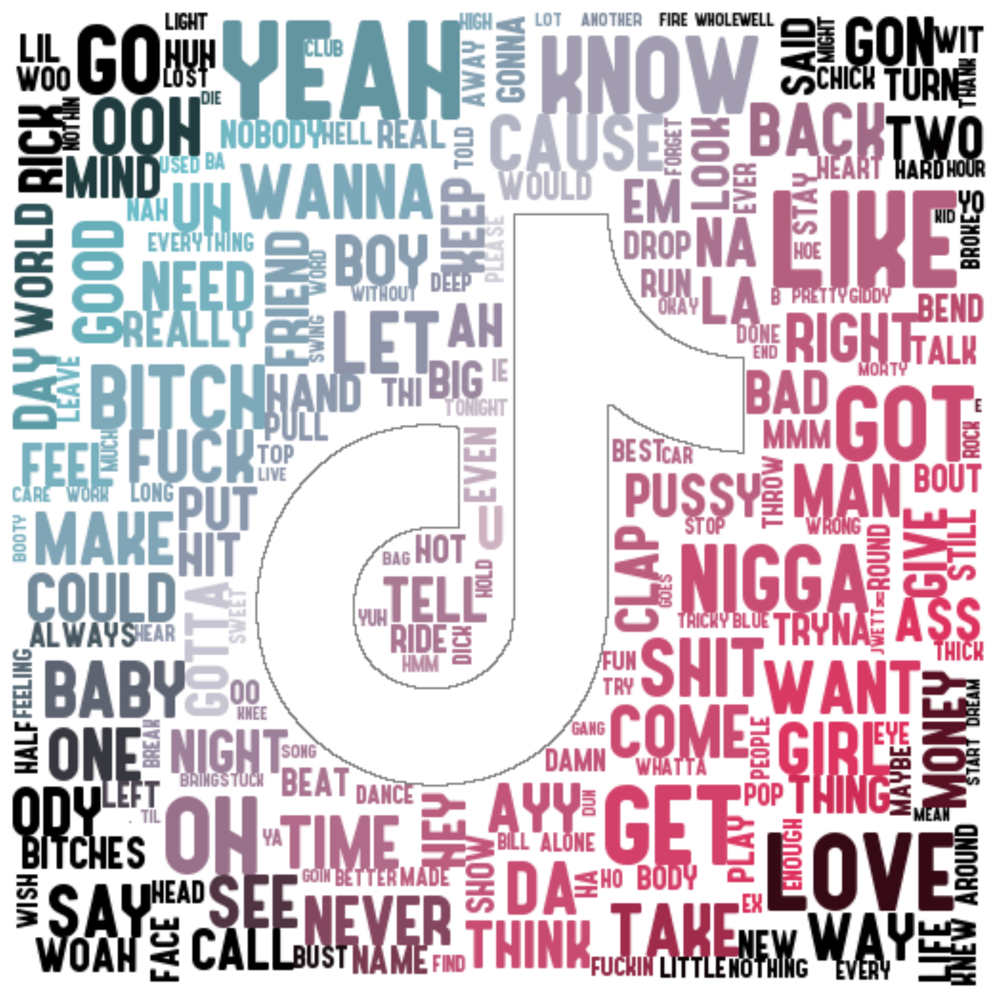

In [79]:
wordcloud(english_tracks,'lyrics_preprocessed')